# Week 7: Tremolo/Beats Effects 2

<font size="6"> Laboratory 6 </font> <br>
<font size="3"> Last updated February 25, 2023 </font>

## <span style="color:orange;"> 00. Content </span>

### Mathematics 
- Laws of sines/cosines
    
### Programming Skills 
- Type here
    
### Embedded Systems 
- N/A

## <span style="color:orange;"> 0. Required Hardware </span>
- headphones

<h3 style="background-color:lightblue"> Write your name and email below: </h3>

**Name:** Aidan Leib

**Email:** pleib@purdue.edu

# <span style="color:orange;">  1. Building a Voice Recorder </span> 

Before we begin, we need to install a library which will help us in manipulating audio with python.
We will be using PyAudio for this purpose as it is easy to use and works on a variety of different environments.

Installation instructions for PyAudio can be found from [here](https://pypi.org/project/PyAudio/).

To explore more in detail about PyAudio and its features, you could refer the [API docementation for PyAudio](https://people.csail.mit.edu/hubert/pyaudio/docs/)

For Recording Audio with Python, we have to do the following:
1. Open a data stream to get audio data frame from microphone
2. Iterate over the stream and append each frame to a list of frames.
3. Stop and close the data stream.
4. Save the data frames as a .wave file.

[voice_recorder.py](https://github.com/TheDataScienceLabs/DSLab_Fourier/blob/main/book/labs/modulation/tremolo_beats/voice_recorder.py) is implemented following the above pseudo code. It records 5s of mono channel audio and saves it as my_recording.wave

### <span style="color:red"> Exercise 1</span>

Run voice_recorder.py and report your observations.

The recording process was pretty quick and worked well. The recording seems good enough.

### <span style="color:red"> Exercise 2</span>

Modify the voice_recorder.py to record a 10s audio recording of yourself and save it as \<yourname>_voice_clip.wave

In [46]:
#!/usr/bin/env python

"""voice_recorder.py: As the name indicates, this code is used to record audio"""

__author__      = "Adharsh Sabukumar"



import pyaudio
import wave


chunk = 1024
FORMAT = pyaudio.paInt16
CHANNELS = 1
RATE = 44100
RECORD_SECONDS = 10
OUTPUT_FILE_NAME = "aidan_voice_clip.wav"

p = pyaudio.PyAudio()

stream = p.open(format = FORMAT,
                channels = CHANNELS,
                rate = RATE,
                input = True,
                frames_per_buffer = chunk)

frames = list()

print("*************************************")
print("*******   recording started   *******")

for i in range(0, RATE//chunk * RECORD_SECONDS):

    frame = stream.read(chunk, exception_on_overflow = False)
    frames.append(frame)


print("******   recording completed   ******")
print("*************************************")


stream.stop_stream()
stream.close()
p.terminate()

print("----  saving audio as .wav file  ----")
print("*************************************")

file = wave.open(OUTPUT_FILE_NAME, 'wb')
file.setnchannels(CHANNELS)
file.setsampwidth(p.get_sample_size(FORMAT))
file.setframerate(RATE)
file.writeframes(b''.join(frames))
file.close()

*************************************
*******   recording started   *******
******   recording completed   ******
*************************************
----  saving audio as .wav file  ----
*************************************


### <span style="color:red"> Exercise 3</span>

Write a Python code to play the recorded audio using PyAudio. Hint: set mode as output while creating the stream object.

In [2]:
import pyaudio
import wave


chunk = 1024
FORMAT = pyaudio.paInt16
CHANNELS = 1
RATE = 44100
RECORD_SECONDS = 10
INPUT_FILE_NAME = "./aidan_voice_clip.wav"

p = pyaudio.PyAudio()

stream = p.open(format = FORMAT,
                channels = CHANNELS,
                rate = RATE,
                output = True,
                frames_per_buffer = chunk)

file = wave.open(INPUT_FILE_NAME, 'rb')
output = file.readframes(RATE * RECORD_SECONDS)
# file.setnchannels(CHANNELS)
# file.setsampwidth(p.get_sample_size(FORMAT))
# file.setframerate(RATE)
stream.write(output)
file.close()

### <span style="color:red"> Exercise 4 </span>

Modulate the sound of your voise with the triangular wave and play the modulated sound Change the triagular wave frequency and play the resulting modulated sound. Compare what happens when the frequency is very low (<20Hz) and when it is very high (20-20kHZ).

In [15]:
import numpy as np
from scipy.io import wavfile
import matplotlib.pyplot as plt
from IPython.display import Audio

def triangle(freq, n):
    """
    freq = frequency of the triangle wave
    n = the length of the wave in seconds
    """
    t = np.linspace(0, n, n * 44100)
    T = 1 / freq
    amplitude = 8 / T
    return amplitude * (2 * np.abs(t / T - np.floor(t / T + 1 / 2)) - 0.5)

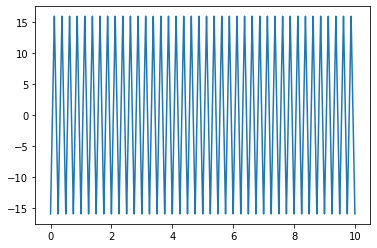

In [9]:
tri = triangle(4, 10)
t = np.linspace(0, 10, 10 * 44100)

plt.plot(t, tri)

In [23]:
tri = triangle(4, 10)
tri = np.array(tri, dtype="int16")

(rate, input_array) = wavfile.read('aidan_voice_clip.wav')

Audio(input_array, rate = RATE)

In [24]:
mod_voice = tri * np.append(input_array, [0 for i in range(len(tri) - len(input_array))])

Audio(mod_voice, rate = RATE)

In [27]:
tri = triangle(200, 10)
mod_voice = tri* np.append(input_array, [0 for i in range(len(tri) - len(input_array))])

Audio(mod_voice, rate=RATE)

In [28]:
tri = triangle(2000, 10)
mod_voice = tri* np.append(input_array, [0 for i in range(len(tri) - len(input_array))])

Audio(mod_voice, rate=RATE)

When the frequency is very low, it almost sounds like the sample is slowed down, and you can very easily follow the ups and downs of the triangle wave. When it is much faster, the recording sounds very digital and scratchy, and if it's too high it is difficult to understand.

### <span style="color:red"> Exercise 5 </span>

Modulate the sound of your voise with the square wave and play the modulated sound.

In [36]:
def square(freq, n):
    """
    freq = frequency of the triangle wave
    n = the length of the wave in seconds
    """
    t = np.linspace(0, n, n * 44100)
    amplitude = 2 * freq
    x = np.sin(2 * np.pi * freq * t)
    return np.sign(x) * amplitude

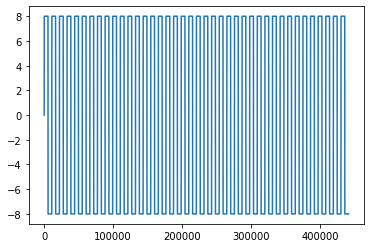

In [37]:
plt.plot(square(4, 10))

In [38]:
sq = square(4, 10)
mod_voice = sq * np.append(input_array, [0 for i in range(len(tri) - len(input_array))])

Audio(mod_voice, rate=RATE)

In [42]:
sq = square(2000, 10)
mod_voice = sq * np.append(input_array, [0 for i in range(len(tri) - len(input_array))])

Audio(mod_voice, rate=RATE)

## Create your own modulation effect

### <span style="color:red"> Exercise 6 </span>

Create the signal $x(t)$ a recording of you saying "B'Euler up!". 

In [47]:
x = wavfile.read('boiler_up.wav')[1]

### <span style="color:red"> Exercise 7 </span>

Create an original periodic signal $c_1(t)$. Use it to modulate $x(t)$ and play the resulting modulated signal. 

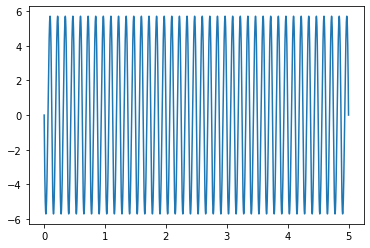

In [76]:
t = np.linspace(0, 5, 5 * 44100)

c_1 = np.sin(2 * np.pi * 4 * t) * triangle(4, 5)
plt.plot(t, c_1)

In [77]:
mod_recording = c_1 * np.append(x, [0 for i in range(len(c_1) - len(x))])
Audio(mod_recording, rate=RATE)

### <span style="color:red"> Exercise 8 </span>

Create another original periodic signal  $c_2(t)$ with the same frequency as  $c_1(t)$. Use it to modulate $x(t)$ and play the resulting modulated signal. 

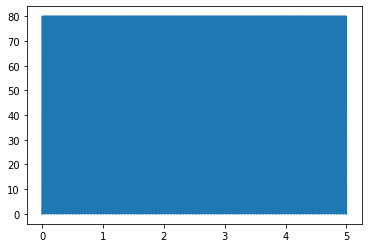

In [78]:
c_2 = np.sin(2 * np.pi * 40 * t) * square(40, 5)
plt.plot(t, c_2)

In [79]:
mod_recording = c_2 * np.append(x, [0 for i in range(len(c_1) - len(x))])
Audio(mod_recording, rate=RATE)

### <span style="color:red"> Exercise 9 </span>

Play the signal $x(t) c_1(t) c_2(t)$. Describe that signal. 

In [80]:
mod_recording = c_1 * c_2 * np.append(x, [0 for i in range(len(c_1) - len(x))])
Audio(mod_recording, rate=RATE)

This signal is very messy, however much different from the original recording.

### <span style="color:red"> Exercise 10 </span>

Play the signal $x(t) (c_1(t) + c_2(t)) $. Describe that signal. 

In [81]:
mod_recording = (c_1 + c_2) * np.append(x, [0 for i in range(len(c_1) - len(x))])
Audio(mod_recording, rate=RATE)

This one kinda just sounds like the first modulation I had in Excerise 7; Very electronic and distorted.

# <span style="color:orange;">  2. Instrument Tuning with "beats" </span> 

Orchestra players are well familiar with the tremolo effect, which they call "beats", as they use it to tune their instruments. 

The idea is the following: if two instruments play the same note, then the sound produced corresponds to the addition of two periodic signals. For simplicity, let's assume that the first instrument plays a cosine wave at a frequency $f_a$:

$$ x_a(t)= \cos 2\pi f_a t, $$

and let's assume that the second instrument plays another cosine wave at a similar (but not equal) frequency $f_b$: 

$$ x_b(t)= \cos 2\pi f_b t. $$

Then the combined sound is 

$$x(t)= x_a(t)+x_b(t)=   \cos 2\pi f_a t+ \cos 2\pi f_b t.$$

### <span style="color:red"> Exercise 11 </span>

Assume $f_a=400 Hz$ and $f_b=410 Hz$. Write $x(t)$ as a product of two sine waves. 

$$x(t) = \frac{1}{2} \cos(2 \pi 400 t) - \frac{1}{2} \cos(2 * \pi 410 t)$$
$$x(t) = \sin \left( 2 \pi \left( \frac{400 + 410}{2} \right) t \right) \sin \left( 2 \pi \left( \frac{410 - 400}{2} \right) \right)$$
$$x(t) = \sin \left( 2 \pi 405 t \right) \sin \left( 2 \pi 5 \right)$$

To understand what happens in general, we replace $f_1$ by $\frac{f_a+f_b}{2}$ and  $f_2$ by $ \frac{f_b-f_a}{2}$ in the equation above. This gives us

$$ \sin\left(  2 \pi \left(  \frac{f_a+f_b}{2} \right) t \right) \sin \left( 2 \pi \left(  \frac{f_b-f_a}{2}    \right) t           \right) = \frac{1}{2}\cos \left( 2 \pi f_a t \right) - \frac{1}{2}\cos\left( 2 \pi f_b t \right) .$$


In other words, two cosine waves with a similar frequency added together correspond to modulating a sine wave at the average frequency with a (carrier) sine wave at half the frequency difference. If $f_1$ and $f_2$ are close frequencies in the audible range, then their difference is small. Therefore, one expects a tremolo effect to occur when the instruments are not in tune. 

### <span style="color:red"> Exercise 12</span>

Suppose the signals $ \sin \left( 2 \pi 440 t \right) $ (a middle A) and the signal $\sin \left( 2\pi 442 t\right)$ are added together. What would be the frequency of the carrier (i.e., the beat/tremolo frequency)? Play the added signals: do you hear the beats? Plot the modulated signal: is it the same? Plot a few cycles of each signal (added and modulated) and compare. 

In [93]:
f_a = 440
f_b = 442

x = np.sin(2 * np.pi * f_a * t) + np.sin(2 * np.pi * f_b * t)
Audio(x, rate=RATE)

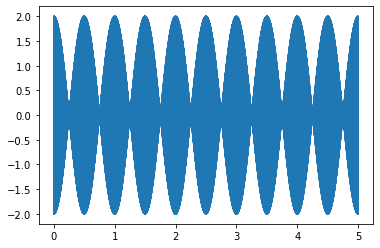

In [96]:
plt.plot(t, x)

In [94]:
modulated = np.cos(2 * np.pi * (f_a + f_b) / 2 * t) * np.cos(2 * np.pi * (f_b - f_a) / 2 * t)
Audio(modulated, rate=RATE)

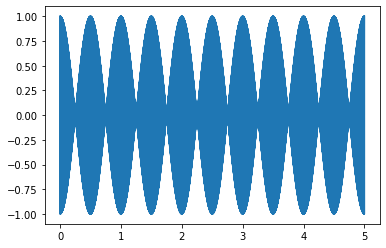

In [95]:
plt.plot(t, modulated)

### <span style="color:red"> Exercise 13 </span>

Can two musicians listening to the added sounds determine the difference between the frequencies of their instruments? If so, how? If not, why not.

Most musicians can tell the relative difference between their instruments I think, meaning they can move their pitch higher and lower and figure out if the beats get worse or better. From there they can determine which way they need to go to match pitch.

### <span style="color:red"> Exercise 14</span>

Can two musicians playing out-of-tune instruments use the beat phenomenon so to tune their instrument in such a way that they play an A at the 440Hz frequency?  If so, how? If not, explain why not. 

Yes, musicians can use the beat phenomenon to tune their out-of-tune instruments together. They do this my paying attention to the frequency of the beats, the slower the beats are, the closer the musicians are to the same note.

## <span style="color:green;"> Reflection </span>

Do not skip this section! Lab will be graded only on completion of this section.

__1. What parts of the lab, if any, do you feel you did well? <br>
2. What are some things you learned today? <br>
3. Are there any topics that could use more clarification? <br>
4. Do you have any suggestions on parts of the lab to improve?__

<h3 style="background-color:lightblue"> Write Answers for the Reflection Below </h3>

1. I think I did part 1 fairly well, thanks to the tip about simplifying the audio output.
2. I learned how you can use different waves to modulate recordings in certain ways.
3. I was a bit confused when performing excersises 11 and 12, mainly because I wasn't sure what they were asking for. Can you model the addition of sine waves the same way we did cosines in the example?
4. If you could explain the process of modeling the addition of two waves better from exercise 11, I think that would help a lot.